In [ ]:
!pip install mediapipe opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 10.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manyl

In [ ]:
import cv2
import mediapipe as mp
import numpy as np
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
mp_drawing = mp.solutions.drawing_utils
mp_pose = mp.solutions.pose
from moviepy.editor import VideoFileClip
from IPython.display import display

In [ ]:
def get_frames(video_path, seconds):
        """
        Reads video frames.
        @param seconds: time between read frames.
        @return: array with frames for processing.
        """
        cap = cv2.VideoCapture(video_path)
        frames = []
        count = 0
        video_length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        fps = int(cap.get(cv2.CAP_PROP_FPS))

        while count * seconds * fps < video_length:
            cap.set(cv2.CAP_PROP_POS_MSEC, (count * 1000 * seconds))
            count += 1
            ret, frame = cap.read()
            if not ret or frame is None:
                break
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)

        cap.release()
        return frames

In [ ]:
def get_all_frames(video_path):
    cap = cv2.VideoCapture(video_path)
    frames = []
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
    cap.release()
    return frames

In [ ]:
def get_vector_between_points(point1, point2):
    x1, y1 = point1[0], point1[1]
    x2, y2 = point2[0], point2[1]
    vector = np.array([x2, y2]) - np.array([x1, y1])
    return vector

In [ ]:
def angle_between_vectors(v1, v2):
    dot_product = np.dot(v1, v2)
    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)
    cos_theta = dot_product / (norm_v1 * norm_v2)
    angle_rad = np.arccos(np.clip(cos_theta, -1.0, 1.0))

    # Переводим радианы в градусы
    angle_deg = np.degrees(angle_rad)

    # Проверяем знак угла и приводим его в диапазон от 0 до 360 градусов
    if np.cross(v1, v2) < 0:
        angle_deg = 360 - angle_deg

    return angle_deg

In [ ]:
def calculate_angle(first, mid, end):
    first = np.array(first)
    mid = np.array(mid)
    end = np.array(end)

    radians = np.arctan2(end[1]-mid[1], end[0]-mid[0]) - np.arctan2(first[1]-mid[1], first[0]-mid[0])
    angle = np.abs(radians*180.0/np.pi)

    return angle

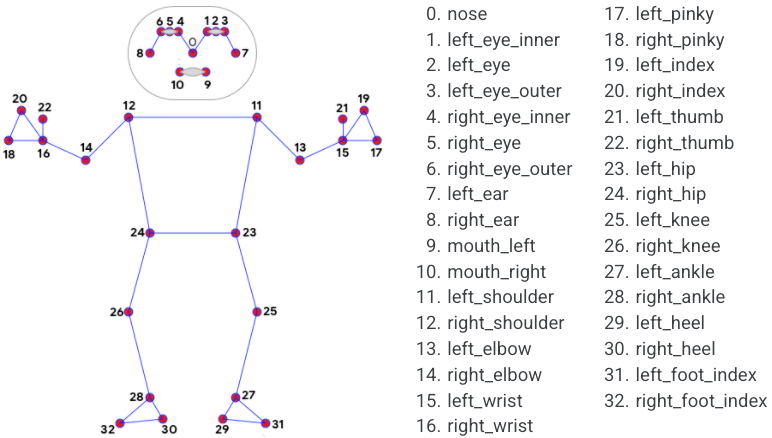

In [ ]:
display(Image('joints.png'))

In [ ]:
joints = [11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]
body_parts = {}

for joint in joints:
  body_parts[joint] = {}

body_angles = [[16, 14, 12], [14, 12, 11], [15, 13, 11], [12, 11, 13], [28, 26, 24],
               [27, 25, 23], [26, 24, 12], [25, 23, 11], [21, 15, 19], [19, 15, 17],
               [22, 16, 20], [20, 16, 18], [18, 20, 16, 14], [17, 19, 15, 13], [11, 0, 12]]

mean_angle = {}
for angle in body_angles:
  mean_angle[angle[0]] = {}
  mean_angle[angle[0]]['prev'] = None
  mean_angle[angle[0]]['count'] = 0
  mean_angle[angle[0]]['res'] = 0

In [ ]:
body_names = {16:{'name':'правый локоть', 'res':[]}, 14:{'name':'правое плечо', 'res':[]},15:{'name':'левый локоть', 'res':[]},\
              12:{'name':'левое плечо', 'res':[]}, 28:{'name':'правое колено', 'res':[]}, 27:{'name':'левое колено', 'res':[]}, \
              26:{'name':'правое бедро', 'res':[]}, 25:{'name':'левое бедро', 'res':[]}, 21:{'name':'левый большой палец', 'res':[]},\
              19:{'name':'левая кисть', 'res':[]}, 22:{'name':'правый большой палец', 'res':[]},20:{'name':'правая кисть', 'res':[]},\
              18:{'name':'правое запястье', 'res':[]}, 17:{'name':'левое запястье', 'res':[]}, 11:{'name':'голова', 'res':[]}}

In [ ]:
def point_between(point1, point2):
  return [(point1.x + point2.x)/2, (point1.y + point2.y)/2]

In [ ]:
def min_angle_difference(angle1, angle2):
    diff1 = abs(angle1 - angle2)
    diff2 = 360 - diff1
    return min(diff1, diff2)

In [ ]:
def calculate_angles(landmarks, mean_angle):
  for angles in body_angles:
      if all(landmarks[angle].visibility >= 0.5 for angle in angles):
        point_second = [landmarks[angles[-1]].x, landmarks[angles[-1]].y]
        point_mid = [landmarks[angles[-2]].x, landmarks[angles[-2]].y]
        if len(angles) > 3:
          point_first = point_between(landmarks[angles[0]], landmarks[angles[1]])
        else:
          point_first = [landmarks[angles[0]].x, landmarks[angles[0]].y]
        v1 = get_vector_between_points(point_first, point_mid)
        v2 = get_vector_between_points(point_mid, point_second)
        angle = angle_between_vectors(v1, v2)
        if mean_angle[angles[0]]['prev'] != None:
          mean_angle[angles[0]]['res'] += min_angle_difference(angle, mean_angle[angles[0]]['prev'])
          mean_angle[angles[0]]['count'] += 1
        else:
          mean_angle[angles[0]]['prev'] = angle
      else:
        mean_angle[angles[0]]['prev'] = None
  return mean_angle

In [ ]:
def process_velocity(frames):
  with mp_pose.Pose(min_detection_confidence=0.5, min_tracking_confidence=0.5) as pose:
    mean_angle = {}
    for angle in body_angles:
      mean_angle[angle[0]] = {}
      mean_angle[angle[0]]['prev'] = None
      mean_angle[angle[0]]['count'] = 0
      mean_angle[angle[0]]['res'] = 0
    for image in frames:
      results = pose.process(image)
      try:
        landmarks = results.pose_landmarks.landmark
        mean_angle = calculate_angles(landmarks, mean_angle)
      except Exception as ex:
        print(ex.args[0])
    for angle in body_angles:
      if mean_angle[angle[0]]['count'] > 0:
        result = mean_angle[angle[0]]['res'] / mean_angle[angle[0]]['count']
        body_names[angle[0]]['res'].append(round(result, 2))
      else:
        body_names[angle[0]]['res'].append(None)
    return body_names[angle[0]]['res']

In [ ]:
def get_subarray(array, subset, ind):
  last_ind = min(ind+subset, len(array))
  return array[ind:last_ind]

In [ ]:
def generate_string(data, index):
    result = ""
    values = data["res"]
    if index < len(values) and values[index] is not None:
        result += f"{data['name']} - {values[index]}"
    return result

In [ ]:
video_path = "9.mp4"
cap = cv2.VideoCapture(video_path)
frames = get_all_frames(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = len(frames)
video_duration_sec = total_frames / fps
frames_per_second = int(total_frames // video_duration_sec)
cap.release()
cv2.destroyAllWindows()

In [ ]:
for i in range(0, total_frames, int(fps) * 10):
    second_frames = get_subarray(frames, frames_per_second, i)
    result = process_velocity(second_frames)

In [ ]:
body_names

{16: {'name': 'right elbow', 'res': [11.78, 83.85]},
 14: {'name': 'right shoulder', 'res': [2.47, 10.72]},
 15: {'name': 'left elbow', 'res': [4.25, 69.43]},
 12: {'name': 'left shoulder', 'res': [5.4, 15.8]},
 28: {'name': 'right knee', 'res': [None, None]},
 27: {'name': 'left knee', 'res': [None, None]},
 26: {'name': 'right hip', 'res': [None, None]},
 25: {'name': 'left hip', 'res': [None, None]},
 21: {'name': 'left thumb', 'res': [34.47, 28.02]},
 19: {'name': 'left pinky', 'res': [31.77, 20.94]},
 22: {'name': 'right thumb', 'res': [0.22, 11.82]},
 20: {'name': 'right pinky', 'res': [0.43, 10.16]},
 18: {'name': 'right wrist', 'res': [14.45, 17.23]},
 17: {'name': 'left wrist', 'res': [6.56, 11.08]},
 11: {'name': 'head', 'res': [2.68, 6.88]}}

In [ ]:
body_names

{16: {'name': 'правый локоть', 'res': [18.85, 4.41]},
 14: {'name': 'правое плечо', 'res': [5.43, 5.85]},
 15: {'name': 'левый локоть', 'res': [121.41, 11.07]},
 12: {'name': 'левое плечо', 'res': [6.19, 8.75]},
 28: {'name': 'правое колено', 'res': [None, None]},
 27: {'name': 'левое колено', 'res': [None, None]},
 26: {'name': 'правое бедро', 'res': [None, None]},
 25: {'name': 'левое бедро', 'res': [None, None]},
 21: {'name': 'левый большой палец', 'res': [14.67, 14.27]},
 19: {'name': 'левая кисть', 'res': [18.07, 5.0]},
 22: {'name': 'правый большой палец', 'res': [9.62, 6.6]},
 20: {'name': 'правая кисть', 'res': [16.73, 3.86]},
 18: {'name': 'правое запястье', 'res': [3.48, 2.45]},
 17: {'name': 'левое запястье', 'res': [8.14, 1.11]},
 11: {'name': 'голова', 'res': [0.6, 39.59]}}

In [ ]:
font = cv2.FONT_HERSHEY_COMPLEX
cap = cv2.VideoCapture(video_path)
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
fps = int(cap.get(5))
x = 20
y = 50
fontScale = 1
color = (255, 255, 255)
thickness = 2
out = cv2.VideoWriter('output_video.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))
for ind in range(len(frames)):
  current_sec = ind // fps
  index = int(current_sec//10)
  count = 1
  frame = cv2.cvtColor(frames[ind], cv2.COLOR_RGB2BGR)
  for key in body_names.keys():
    text = generate_string(body_names[key], index)
    if len(text) > 0:
      frame = cv2.putText(frame, text, (x, y*count), font, fontScale, color, thickness, cv2.LINE_AA)
      count+=1
  out.write(frame)
cap.release()
out.release()
cv2.destroyAllWindows()

In [ ]:
video_path = "output_video.mp4"
video_clip = VideoFileClip(video_path)
video_clip.ipython_display(width=640)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t: 100%|█████████▉| 1085/1087 [00:19<00:00, 60.58it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file output_video.mp4, 2764800 bytes wanted but 0 bytes read,at frame 1086/1087, at time 37.45/37.45 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4
